#### This Jupyter Notebook contains example code to demonstrate how one may use the functions in biosynseq.metrics and biosynseq.visualize to visualize embeddings for generated, test, or validation sequences using t-SNE and UMAP, and to plot the embedding L2 distance against the pairwise global/local alignment scores for the embeddings. 
#### These visualizations allow the user to evaluate the performance of a deep learning model in terms of learning important sequence properties and generating novel nucleotide sequences with relevant properties. 

In [1]:
from biosynseq import metrics
from biosynseq import visualize
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

In [2]:
%config InlineBackend.figure_format='retina'
%matplotlib inline
plt.rcParams['figure.figsize'] = [8,6]
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams.update({'font.size':14})

# Get t-SNE plots

### Generated Sequences

In [3]:
gen_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/gpt2_generated_embeddings.npy")
gen_fasta_path = Path("/homes/mzvyagin/MDH/perlmutter_data/globalstep2850.fasta")
cluster_path = Path("/homes/lind/MDH-pipeline/visualize/")

{'GC':            z0         z1         GC
 0    8.528804 -12.670070  36.893204
 1   -7.545878   8.741087  58.878505
 2   -2.333218  -2.845573  52.197213
 3   -2.352555   7.972395  61.788618
 4   -0.742224   3.699126  55.691057
 ..        ...        ...        ...
 123 -2.888586   7.390357  61.788618
 124 -1.340617   3.616699  55.691057
 125  9.864945 -11.363039  36.655949
 126  0.090510  -0.663794  46.917450
 127 -4.744442  11.636205  65.835929
 
 [128 rows x 3 columns],
 'SequenceLength':            z0         z1  SequenceLength
 0    8.528804 -12.670070             927
 1   -7.545878   8.741087             963
 2   -2.333218  -2.845573             933
 3   -2.352555   7.972395             984
 4   -0.742224   3.699126             984
 ..        ...        ...             ...
 123 -2.888586   7.390357             984
 124 -1.340617   3.616699             984
 125  9.864945 -11.363039             933
 126  0.090510  -0.663794             957
 127 -4.744442  11.636205             963
 

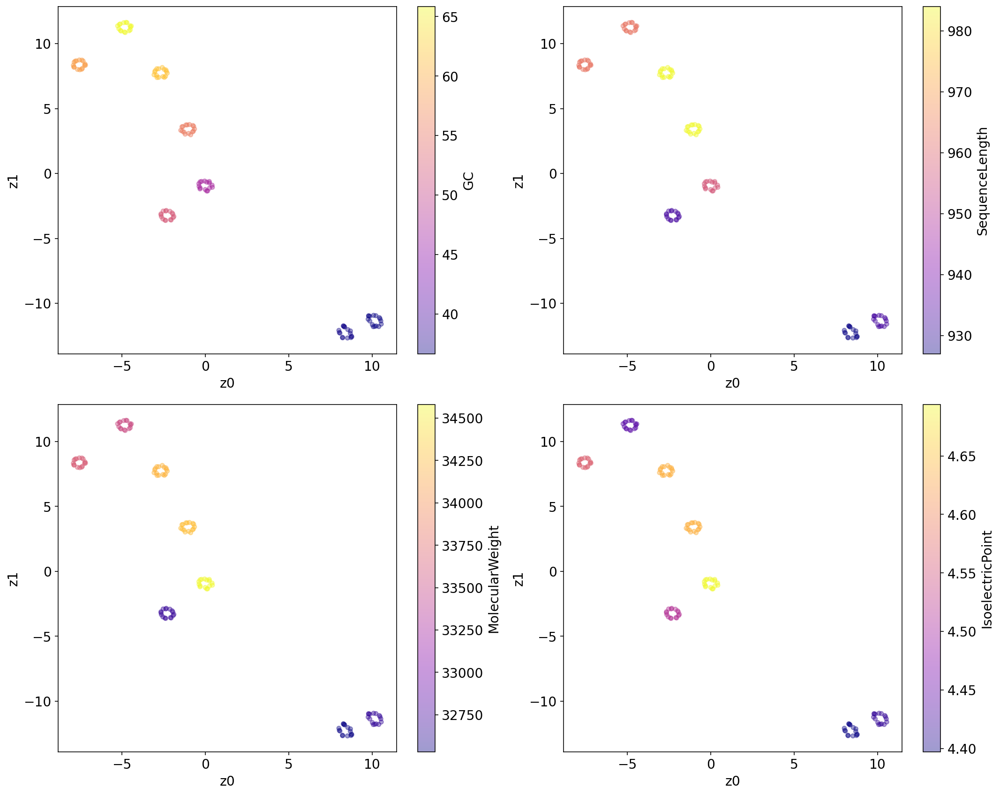

In [4]:
embed_avg = metrics.get_embed_avg(embed_path=gen_embed_path)
paint_df = visualize.get_paint_df(fasta_path=gen_fasta_path, embed_path=gen_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
visualize.get_cluster(embed_data=embed_avg, paint_df=paint_df, cluster_path = cluster_path, tsne_umap="tsne", get_subplots=True)

### Test Sequences

In [5]:
test_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/inference-test-embeddings.npy")
test_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/test.fasta")
cluster_path = Path("/homes/lind/MDH-pipeline/visualize/")

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


{'GC':               z0          z1         GC
 0      97.565887   -5.778632  44.337607
 1       9.152762   67.705116  57.157157
 2      -0.865096  260.839478  60.717658
 3      91.409843  -53.423744  44.764957
 4    -136.846405   25.766462  61.212121
 ...          ...         ...        ...
 3651 -197.719131   50.970387  65.653495
 3652  -11.949988   93.685867  60.341365
 3653   87.868080  229.429672  52.037037
 3654  -66.204330 -118.499680  57.792208
 3655 -225.122314  148.632736  69.529652
 
 [3656 rows x 3 columns],
 'SequenceLength':               z0          z1  SequenceLength
 0      97.565887   -5.778632             936
 1       9.152762   67.705116             999
 2      -0.865096  260.839478            1059
 3      91.409843  -53.423744             936
 4    -136.846405   25.766462             990
 ...          ...         ...             ...
 3651 -197.719131   50.970387             987
 3652  -11.949988   93.685867             996
 3653   87.868080  229.429672            1

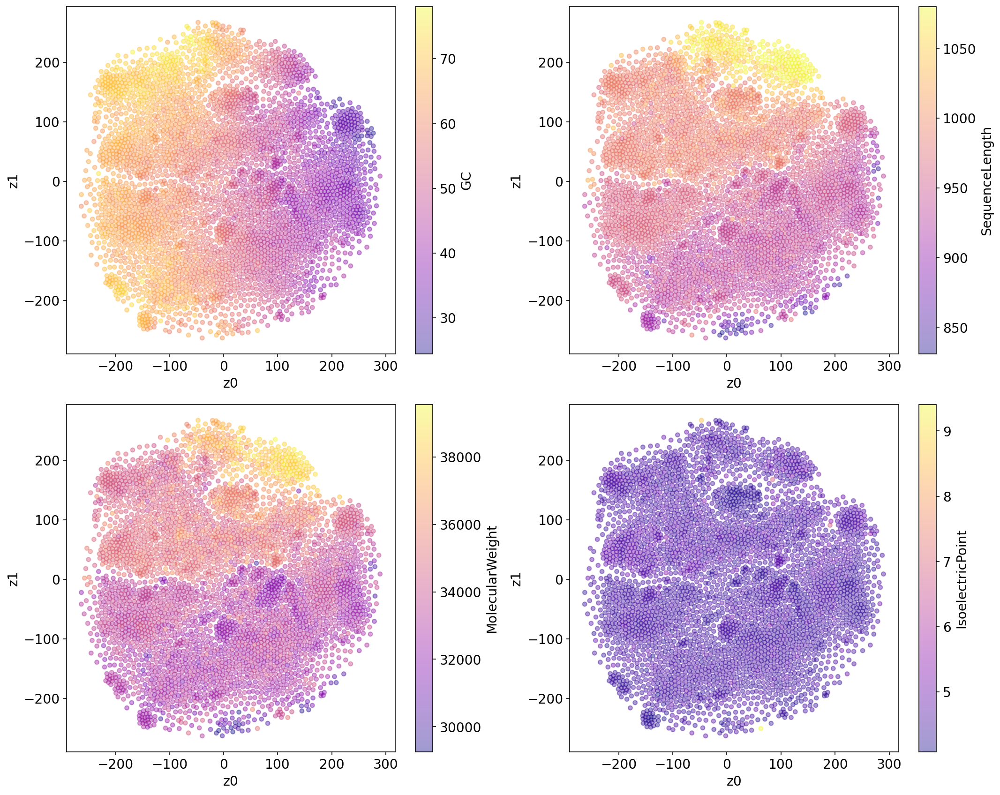

In [6]:
embed_avg = metrics.get_embed_avg(embed_path=test_embed_path)
paint_df = visualize.get_paint_df(fasta_path=test_fasta_path, embed_path=test_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
visualize.get_cluster(embed_data=embed_avg, paint_df=paint_df, cluster_path = cluster_path, tsne_umap="tsne", get_subplots=True)

### Validation Sequences

In [7]:
val_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/inference-val-embeddings.npy")
val_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/val.fasta")
cluster_path = Path("/homes/lind/MDH-pipeline/visualize/")

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


{'GC':               z0          z1         GC
 0      45.320988  255.017975  44.337607
 1      48.719372  -27.153257  57.157157
 2     201.798203 -159.141388  60.717658
 3      24.156607  117.692261  44.764957
 4     -64.947960 -124.598915  61.212121
 ...          ...         ...        ...
 3651  -84.590958 -178.478607  65.653495
 3652   31.022318  -49.888153  60.341365
 3653  228.418869  -81.709686  52.037037
 3654 -131.983826   16.761707  57.792208
 3655  -28.893469 -274.922363  69.529652
 
 [3656 rows x 3 columns],
 'SequenceLength':               z0          z1  SequenceLength
 0      45.320988  255.017975             936
 1      48.719372  -27.153257             999
 2     201.798203 -159.141388            1059
 3      24.156607  117.692261             936
 4     -64.947960 -124.598915             990
 ...          ...         ...             ...
 3651  -84.590958 -178.478607             987
 3652   31.022318  -49.888153             996
 3653  228.418869  -81.709686            1

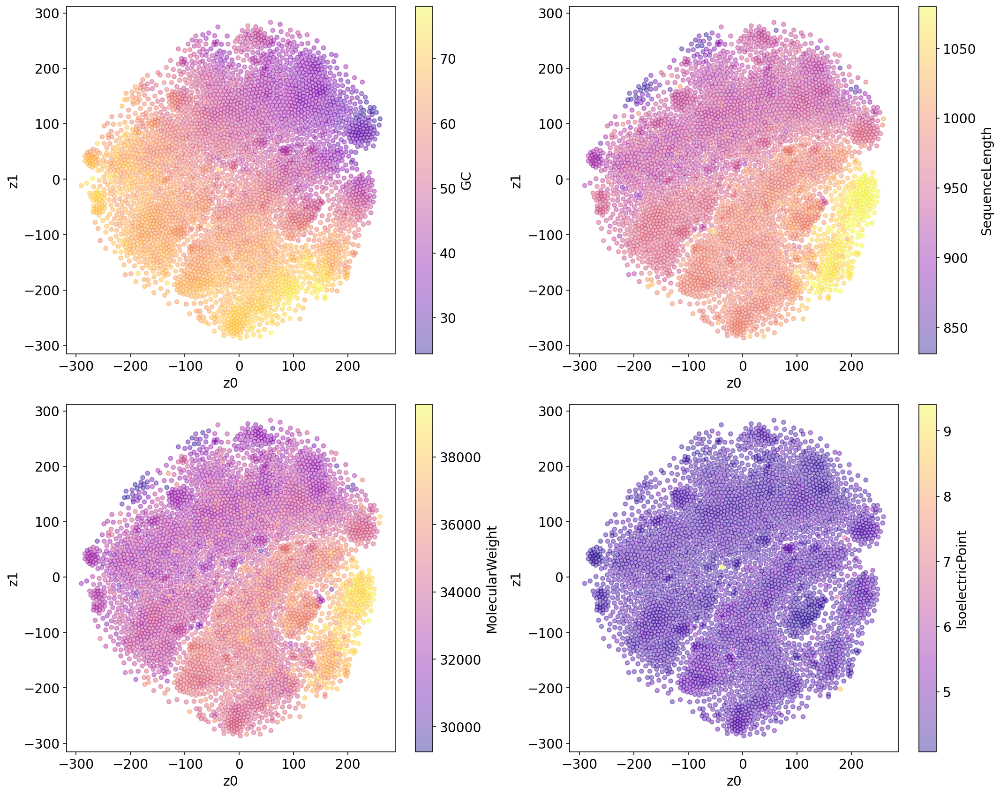

In [8]:
embed_avg = metrics.get_embed_avg(embed_path=test_embed_path)
paint_df = visualize.get_paint_df(fasta_path=test_fasta_path, embed_path=test_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
visualize.get_cluster(embed_data=embed_avg, paint_df=paint_df, cluster_path = cluster_path, tsne_umap="tsne", get_subplots=True)

# Get UMAP plots

### Generated Sequences

In [9]:
gen_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/gpt2_generated_embeddings.npy")
gen_fasta_path = Path("/homes/mzvyagin/MDH/perlmutter_data/globalstep2850.fasta")
cluster_path = Path("/homes/lind/MDH-pipeline/visualize/")

{'GC':             z0         z1         GC
 0     7.389132  -0.594496  36.893204
 1     0.465836  -8.195488  58.878505
 2   -16.068207  -0.550386  52.197213
 3     2.961643  12.836628  61.788618
 4    19.223923   9.467081  55.691057
 ..         ...        ...        ...
 123   3.564610  12.906284  61.788618
 124  19.724739   9.756105  55.691057
 125  -8.569005  -7.415097  36.655949
 126   1.065168 -17.706856  46.917450
 127  -2.997767   4.846734  65.835929
 
 [128 rows x 3 columns],
 'SequenceLength':             z0         z1  SequenceLength
 0     7.389132  -0.594496             927
 1     0.465836  -8.195488             963
 2   -16.068207  -0.550386             933
 3     2.961643  12.836628             984
 4    19.223923   9.467081             984
 ..         ...        ...             ...
 123   3.564610  12.906284             984
 124  19.724739   9.756105             984
 125  -8.569005  -7.415097             933
 126   1.065168 -17.706856             957
 127  -2.997767   4.

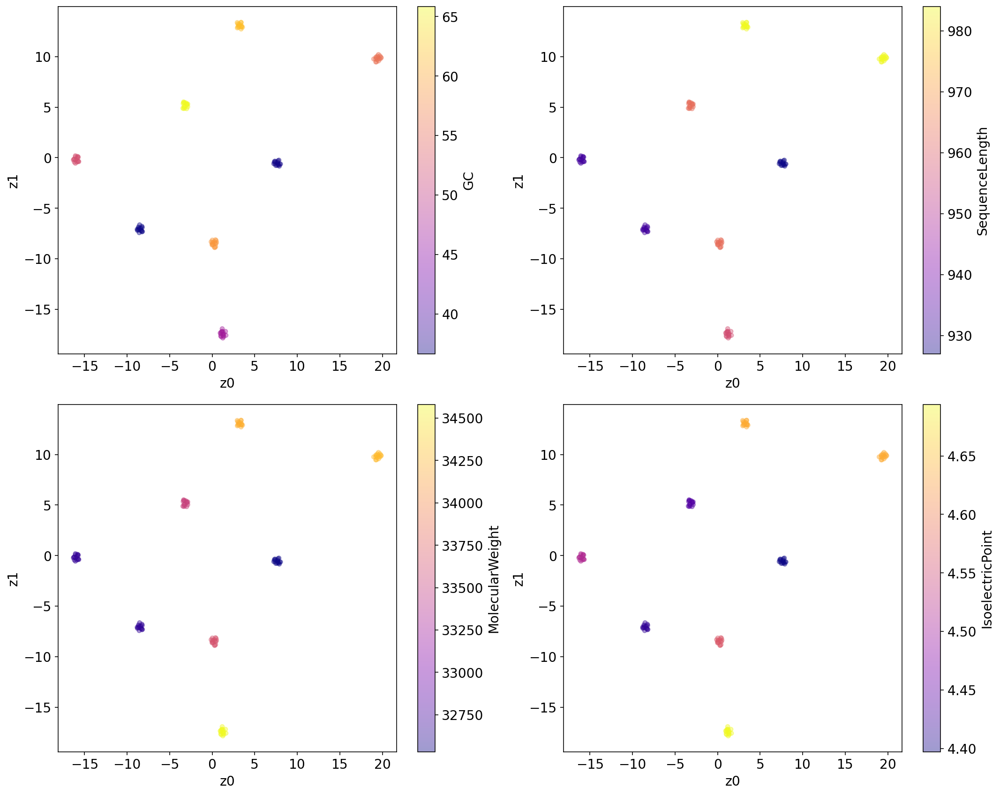

In [10]:
embed_avg = metrics.get_embed_avg(embed_path=gen_embed_path)
paint_df = visualize.get_paint_df(fasta_path=gen_fasta_path, embed_path=gen_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
visualize.get_cluster(embed_data=embed_avg, paint_df=paint_df, cluster_path = cluster_path, tsne_umap="umap", get_subplots=True)

### Test Sequences

In [11]:
test_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/inference-test-embeddings.npy")
test_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/test.fasta")
cluster_path = Path("/homes/lind/MDH-pipeline/visualize/")

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


{'GC':             z0        z1         GC
 0     3.685448  5.675566  44.337607
 1     0.587249 -1.316251  57.157157
 2     0.904962 -6.200028  60.717658
 3     2.620651  3.205788  44.764957
 4    -3.681179 -3.095888  61.212121
 ...        ...       ...        ...
 3651 -4.479226 -3.784634  65.653495
 3652  0.045851 -1.712515  60.341365
 3653  2.924804 -5.269952  52.037037
 3654 -2.091721  2.751355  57.792208
 3655 -4.131907 -6.505486  69.529652
 
 [3656 rows x 3 columns],
 'SequenceLength':             z0        z1  SequenceLength
 0     3.685448  5.675566             936
 1     0.587249 -1.316251             999
 2     0.904962 -6.200028            1059
 3     2.620651  3.205788             936
 4    -3.681179 -3.095888             990
 ...        ...       ...             ...
 3651 -4.479226 -3.784634             987
 3652  0.045851 -1.712515             996
 3653  2.924804 -5.269952            1080
 3654 -2.091721  2.751355             924
 3655 -4.131907 -6.505486             978


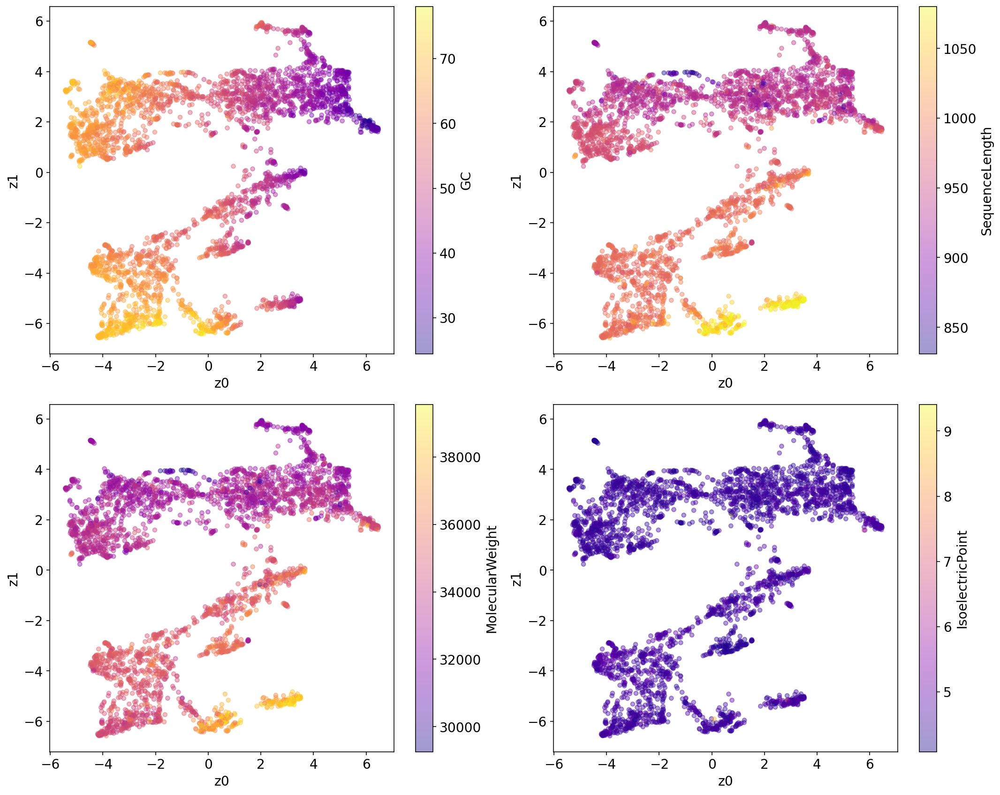

In [12]:
embed_avg = metrics.get_embed_avg(embed_path=test_embed_path)
paint_df = visualize.get_paint_df(fasta_path=test_fasta_path, embed_path=test_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
visualize.get_cluster(embed_data=embed_avg, paint_df=paint_df, cluster_path = cluster_path, tsne_umap="umap", get_subplots=True)

### Validation Sequences

In [13]:
val_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/inference-val-embeddings.npy")
val_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/val.fasta")
cluster_path = Path("/homes/lind/MDH-pipeline/visualize/")

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


{'GC':             z0        z1         GC
 0    -1.675152 -1.292830  60.403397
 1    -3.036141  4.762235  67.085954
 2    -2.647373 -3.773308  44.479830
 3    -4.350834 -4.452694  40.000000
 4    -2.466116  4.166238  62.824507
 ...        ...       ...        ...
 3659  0.810641  4.646047  61.398176
 3660 -2.193107  3.920607  62.193823
 3661  0.850491  5.604160  63.525836
 3662  0.838490  3.862798  58.662614
 3663  4.424069  1.780692  64.204545
 
 [3664 rows x 3 columns],
 'SequenceLength':             z0        z1  SequenceLength
 0    -1.675152 -1.292830             942
 1    -3.036141  4.762235             954
 2    -2.647373 -3.773308             942
 3    -4.350834 -4.452694             930
 4    -2.466116  4.166238             963
 ...        ...       ...             ...
 3659  0.810641  4.646047             987
 3660 -2.193107  3.920607             939
 3661  0.850491  5.604160             987
 3662  0.838490  3.862798             987
 3663  4.424069  1.780692            1056


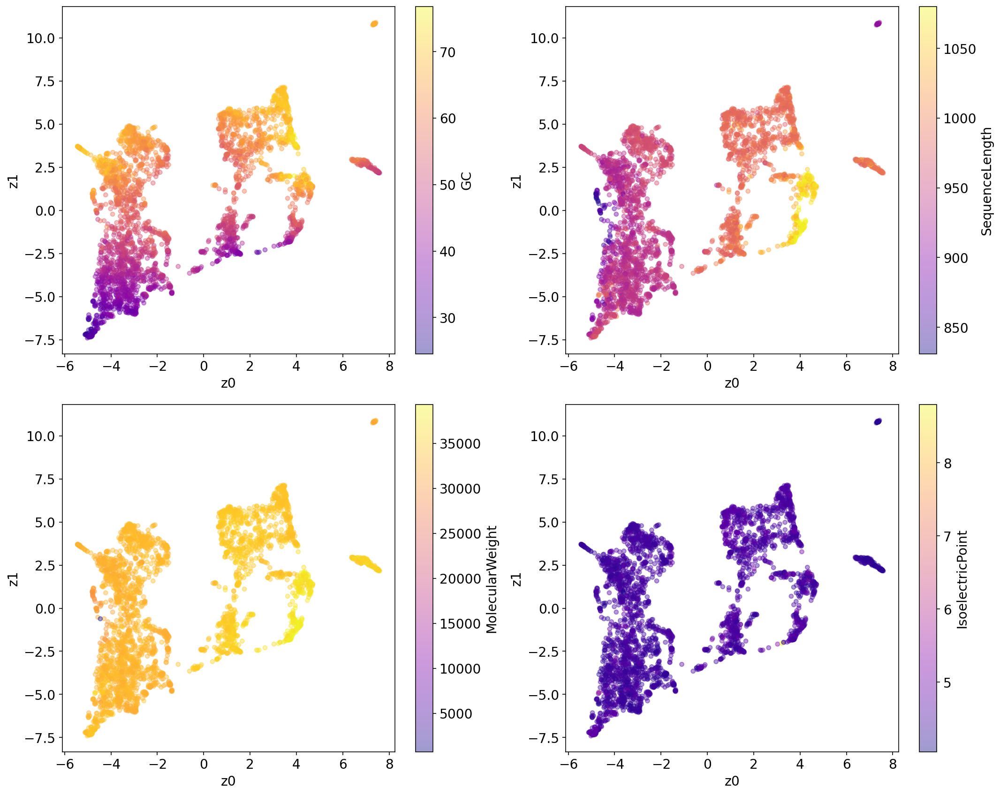

In [14]:
embed_avg = metrics.get_embed_avg(embed_path=val_embed_path)
paint_df = visualize.get_paint_df(fasta_path=val_fasta_path, embed_path=val_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
visualize.get_cluster(embed_data=embed_avg, paint_df=paint_df, cluster_path = cluster_path, tsne_umap="umap", get_subplots=True)

# Compute alignment scores and plot Alignment Scores vs. Embedding L2 Distance

## Global Alignment

### Test Sequences

In [15]:
test_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/inference-test-embeddings.npy")
test_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/test.fasta")
align_plot_path = Path("/homes/lind/MDH-pipeline/visualize/")
align_plot_title = "Test Sequences"
alignment_type = "global"
num_workers = 70
match_score = 1.0
mismatch_score = 0.0
open_gap_score = 0.0
extend_gap_score = 0.0

In [16]:
embed_avg = metrics.get_embed_avg(embed_path=test_embed_path)

In [17]:
dna_seqs = metrics.get_seqs_from_fasta(fasta_path=test_fasta_path)
embed = np.load(test_embed_path)
dna_seqs = dna_seqs[: len(embed)]  # clip DNA sequence to embedding length
protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


In [18]:
test_protein_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=protein_seqs,
    seqs2_rec=protein_seqs,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

3656it [04:08, 14.72it/s]


In [19]:
test_scores_df = metrics.get_scores_df(
    embed_avg=embed_avg,
    scores_matrix=test_protein_align_scores_matrix,
    alignment_type=alignment_type,
)
test_scores_df.corr()

,Embedding L2 Distance,Global Alignment Score
Embedding L2 Distance,1.000000,-0.297758
Global Alignment Score,-0.297758,1.000000


<AxesSubplot:xlabel='Global Alignment Score', ylabel='Embedding L2 Distance'>

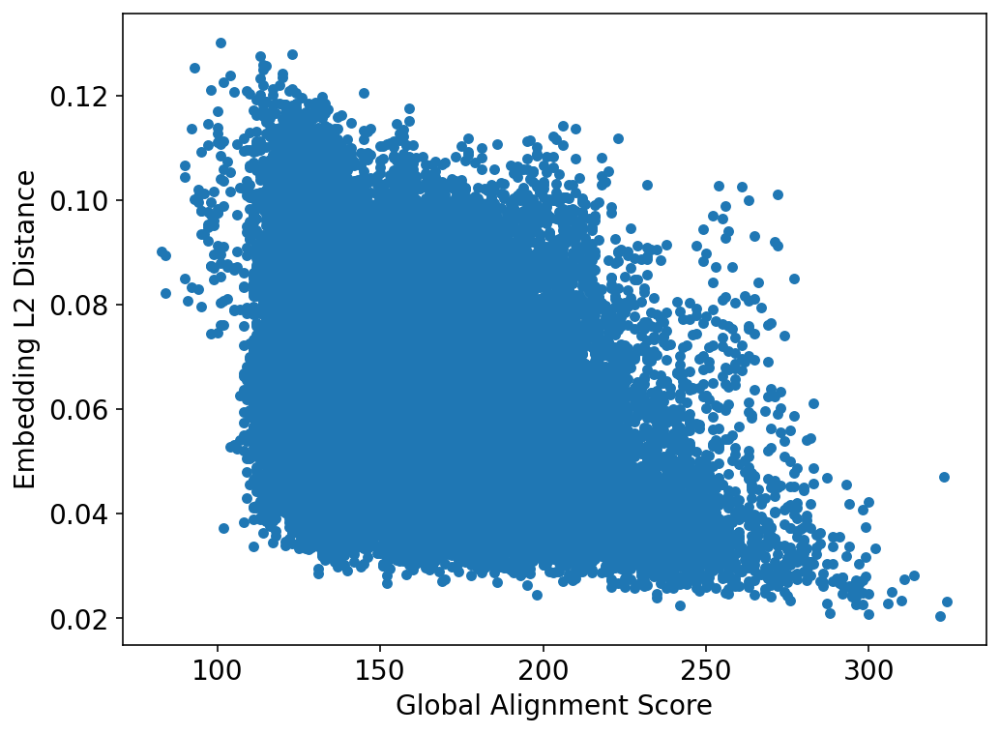

In [20]:
test_scores_df[::100].plot.scatter(y="Embedding L2 Distance", 
                              x="Global Alignment Score")

In [21]:
test_avg_scores_df = metrics.get_avg_scores_df(
    scores_df=test_scores_df, alignment_type=alignment_type
)
test_avg_scores_df.corr()

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
avg_embed_dist,1.000000,0.261829,-0.967206
stdev_embed_dist,0.261829,1.000000,-0.393907
Global Alignment Score,-0.967206,-0.393907,1.000000


In [22]:
test_avg_scores_df

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
0,0.103073,0.000000,73.0
1,0.100218,0.000000,75.0
2,0.110193,0.000000,76.0
3,0.098175,0.000000,77.0
4,0.097871,0.000912,78.0
...,...,...,...
259,0.026762,0.000000,336.0
260,0.026694,0.000000,338.0
261,0.021673,0.000000,342.0
262,0.025710,0.000000,343.0


'Alignment Score vs. Embedding Distance plot has been saved to /homes/lind/MDH-pipeline/visualize.'

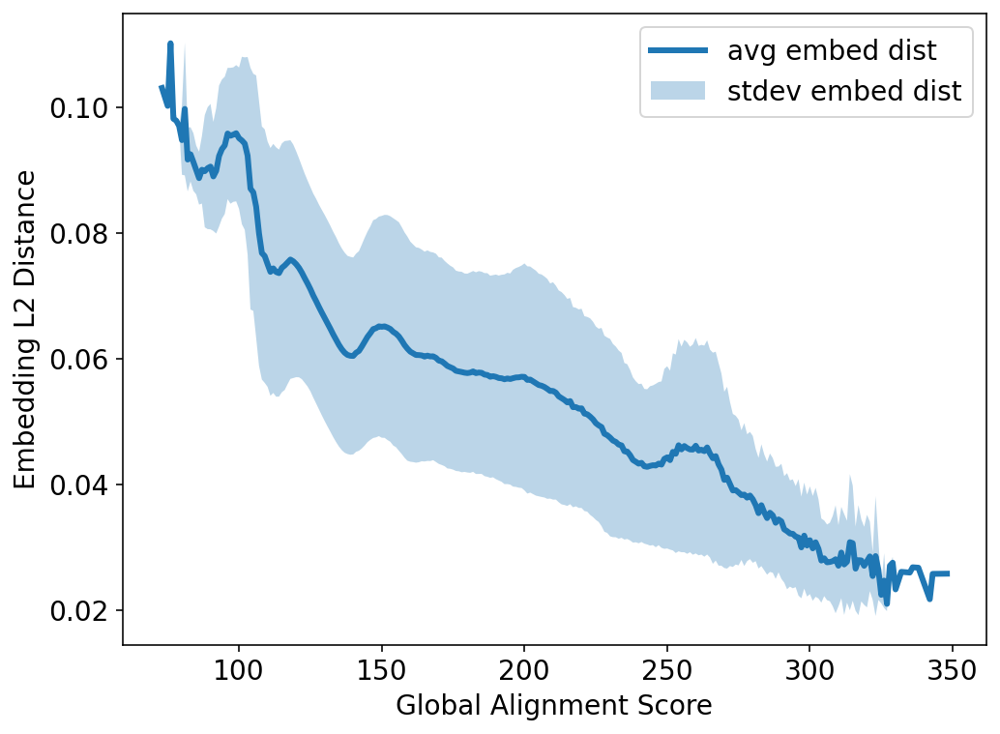

In [23]:
visualize.plot_embed_dist_vs_align_score(
    avg_scores_df=test_avg_scores_df,
    save_path=align_plot_path,
    alignment_type=alignment_type)

### Validation Sequences

In [24]:
val_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/inference-val-embeddings.npy")
val_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/val.fasta")
align_plot_path = Path("/homes/lind/MDH-pipeline/visualize/")
align_plot_title = "Validation Sequences"
alignment_type = "global"
num_workers = 70
match_score = 1.0
mismatch_score = 0.0
open_gap_score = 0.0
extend_gap_score = 0.0

In [25]:
embed_avg = metrics.get_embed_avg(embed_path=val_embed_path)

In [26]:
dna_seqs = metrics.get_seqs_from_fasta(fasta_path=val_fasta_path)
embed = np.load(val_embed_path)
dna_seqs = dna_seqs[: len(embed)]  # clip DNA sequence to embedding length
protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


In [27]:
val_protein_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=protein_seqs,
    seqs2_rec=protein_seqs,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

3664it [04:22, 13.97it/s]


In [28]:
val_scores_df = metrics.get_scores_df(
    embed_avg=embed_avg,
    scores_matrix=val_protein_align_scores_matrix,
    alignment_type=alignment_type,
)
val_scores_df.corr()

,Embedding L2 Distance,Global Alignment Score
Embedding L2 Distance,1.000000,-0.299994
Global Alignment Score,-0.299994,1.000000


<AxesSubplot:title={'center':'Validation Sequences'}, xlabel='Global Alignment Score', ylabel='Embedding L2 Distance'>

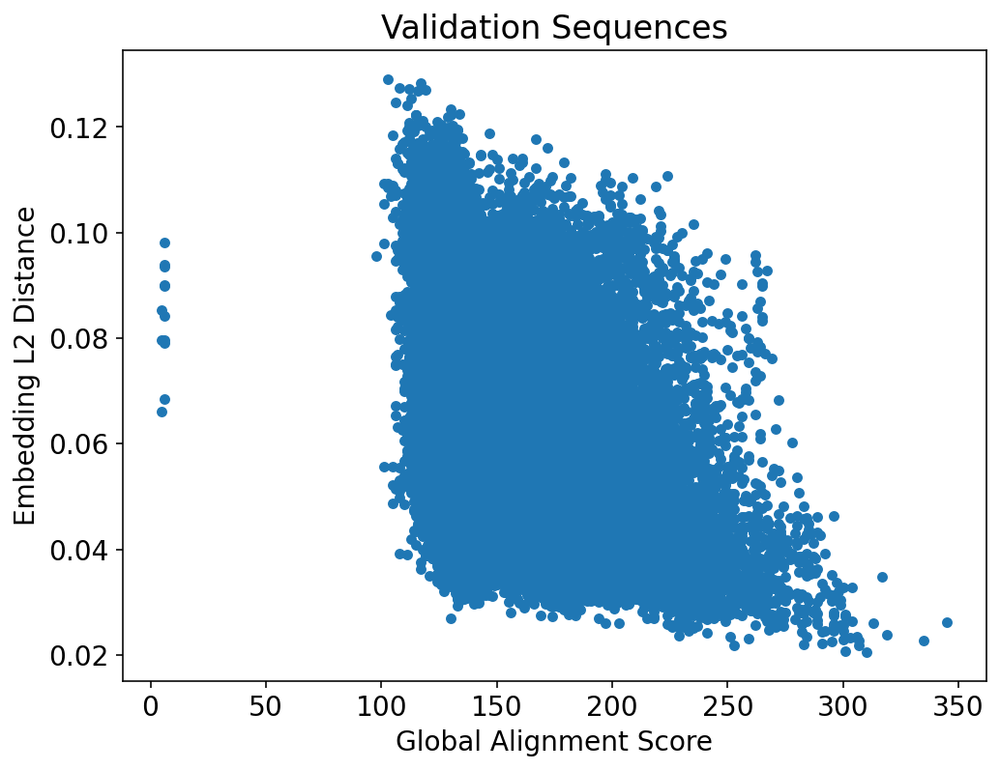

In [29]:
val_scores_df[::100].plot.scatter(y="Embedding L2 Distance", 
                              x="Global Alignment Score", 
                              title="Validation Sequences")

In [30]:
val_avg_scores_df = metrics.get_avg_scores_df(
    scores_df=val_scores_df, alignment_type=alignment_type
)
val_avg_scores_df.corr()

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
avg_embed_dist,1.000000,0.635039,-0.93961
stdev_embed_dist,0.635039,1.000000,-0.67655
Global Alignment Score,-0.939610,-0.676550,1.00000


'Alignment Score vs. Embedding Distance plot has been saved to /homes/lind/MDH-pipeline/visualize.'

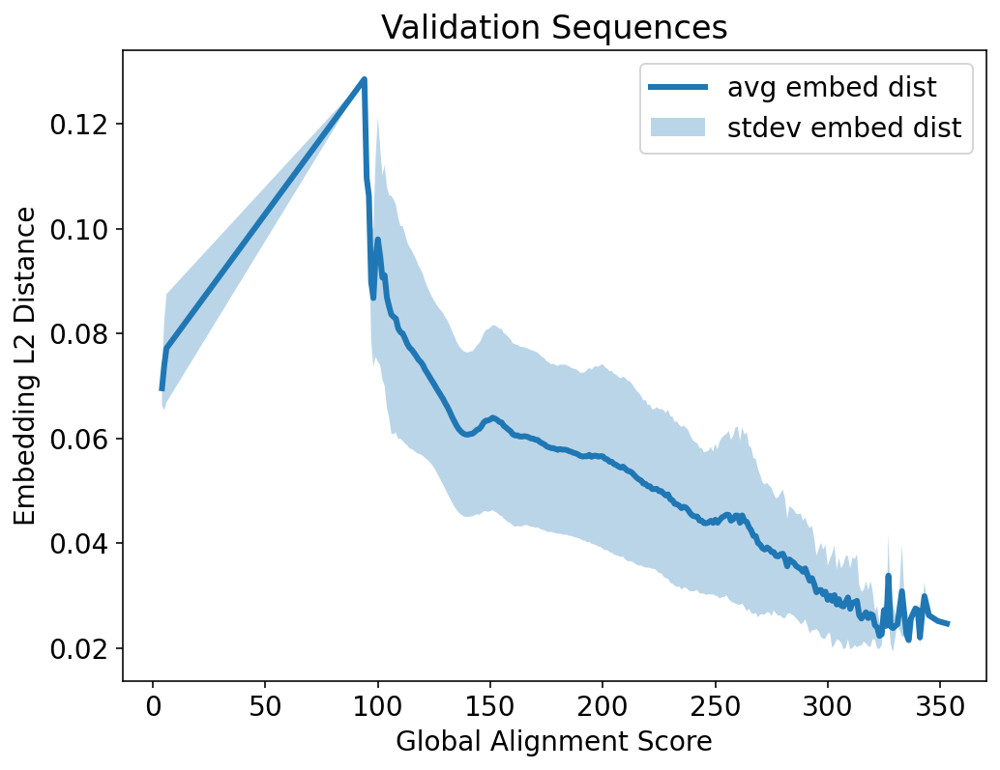

In [31]:
visualize.plot_embed_dist_vs_align_score(
    avg_scores_df=val_avg_scores_df,
    save_path=align_plot_path,
    alignment_type=alignment_type,
    plot_title=align_plot_title
)

## Local Alignment

Note: Local alignment scores currently look the same as global alignment scores, since the scoring metrics for both have not been tuned and are the same. 

### Test Sequences

In [32]:
test_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/inference-test-embeddings.npy")
test_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/test.fasta")
align_plot_path = Path("/homes/lind/MDH-pipeline/visualize/")
align_plot_title = "Test Sequences"
alignment_type = "local"
num_workers = 70
match_score = 1.0
mismatch_score = 0.0
open_gap_score = 0.0
extend_gap_score = 0.0

In [33]:
embed_avg = metrics.get_embed_avg(embed_path=test_embed_path)

In [34]:
dna_seqs = metrics.get_seqs_from_fasta(fasta_path=test_fasta_path)
embed = np.load(test_embed_path)
dna_seqs = dna_seqs[: len(embed)]  # clip DNA sequence to embedding length
protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


In [35]:
test_protein_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=protein_seqs,
    seqs2_rec=protein_seqs,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

3656it [07:35,  8.02it/s]


In [37]:
test_scores_df = metrics.get_scores_df(
    embed_avg=embed_avg,
    scores_matrix=test_protein_align_scores_matrix,
    alignment_type=alignment_type,
)
test_scores_df.corr()

,Embedding L2 Distance,Local Alignment Score
Embedding L2 Distance,1.000000,-0.297758
Local Alignment Score,-0.297758,1.000000


<AxesSubplot:xlabel='Local Alignment Score', ylabel='Embedding L2 Distance'>

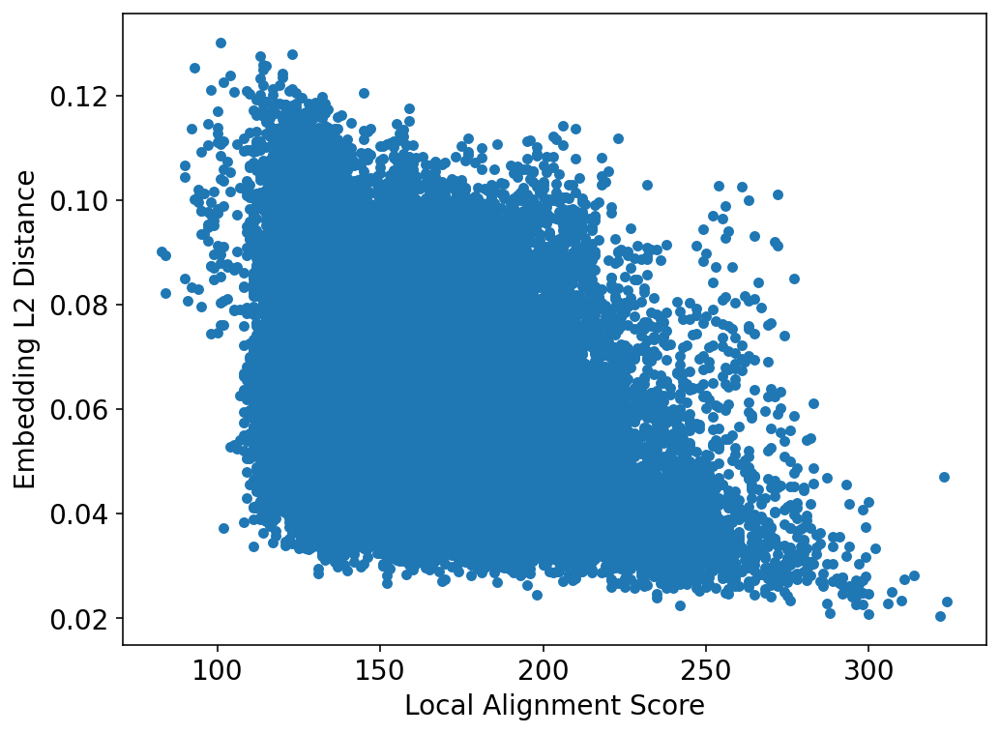

In [38]:
test_scores_df[::100].plot.scatter(y="Embedding L2 Distance", 
                              x="Local Alignment Score")

In [39]:
test_avg_scores_df = metrics.get_avg_scores_df(
    scores_df=test_scores_df, alignment_type=alignment_type
)
test_avg_scores_df.corr()

,avg_embed_dist,stdev_embed_dist,Local Alignment Score
avg_embed_dist,1.000000,0.261829,-0.967206
stdev_embed_dist,0.261829,1.000000,-0.393907
Local Alignment Score,-0.967206,-0.393907,1.000000


In [40]:
test_avg_scores_df

,avg_embed_dist,stdev_embed_dist,Local Alignment Score
0,0.103073,0.000000,73.0
1,0.100218,0.000000,75.0
2,0.110193,0.000000,76.0
3,0.098175,0.000000,77.0
4,0.097871,0.000912,78.0
...,...,...,...
259,0.026762,0.000000,336.0
260,0.026694,0.000000,338.0
261,0.021673,0.000000,342.0
262,0.025710,0.000000,343.0


'Alignment Score vs. Embedding Distance plot has been saved to /homes/lind/MDH-pipeline/visualize.'

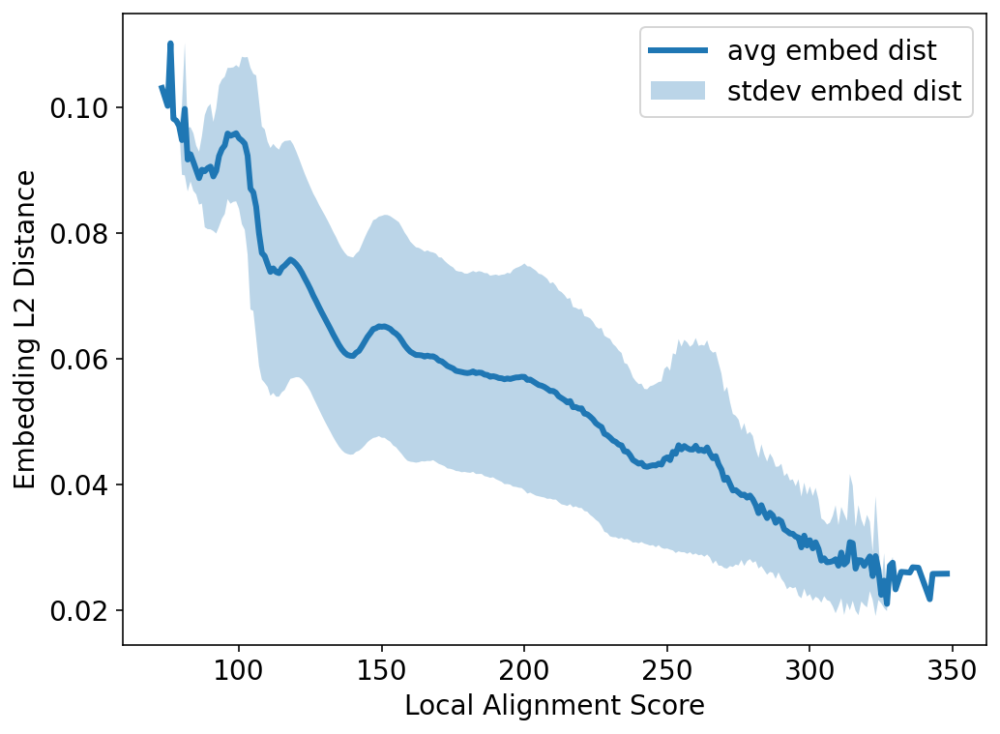

In [44]:
visualize.plot_embed_dist_vs_align_score(
    avg_scores_df=test_avg_scores_df,
    save_path=align_plot_path,
    alignment_type=alignment_type)